# **Importing the required libraries**

In [1]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt

# TF
import tensorflow as tf
from tensorflow import keras
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")
import json
%matplotlib inline

C:\Users\Admin\AppData\Local\Temp\ipykernel_7820\2396540138.py:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


In [2]:
import imageio
import imgaug.augmenters as iaa
import imgaug as ia

In [3]:
from sklearn.model_selection import train_test_split
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

# **Visualize the Data**

In [4]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)






In [5]:
# Classes Directories
NonViolnceVideos_Dir = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/NonViolence"
ViolnceVideos_Dir = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/Violence"

# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

**Play Random Non Violence Video**

In [6]:
#NonViolence_files_names_list
Play_Video("D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/NonViolence/NV_425.mp4")

**Play Random Violence Video**

In [7]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

 **Extracting Frames**

In [8]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 224, 224
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 15
 

DATASET_DIR = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset"
#DATASET_DIR = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/"
 
CLASSES_LIST = ["NonViolence","Violence"]

In [9]:
def frames_extraction(video_path):
 
    frames_list = []
    
    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)
 
    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)
 
    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        # Reading the frame from the video. 
        success, image = video_reader.read() 
        
        # Apply image augmentation
        
        #flip = iaa.Fliplr(1.0)
        zoom = iaa.Affine(scale=1.3)
        random_brightness = iaa.Multiply((1, 1.3))
        #rotate = iaa.Affine(rotate=(-25, 25))
                
        #image_aug = flip(image = image)
        image_aug = random_brightness(image = image)
        image_aug = zoom(image = image_aug)
        #image_aug = rotate(image = image_aug)
        
        if not success:
            break
 
        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(image_aug, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
 
    video_reader.release()
 
    return frames_list

# **Creating the Dataset**

In [10]:
def create_dataset():
 
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes.
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        # 
        for file_name in files_list[:100]: # specific number video per class
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
 
            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)
 
            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:
 
                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
 
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels, video_files_paths

In [11]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: NonViolence
Extracting Data of Class: Violence


# **Encoding and Splitting Training-Testing Sets**

In [12]:
# convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [13]:
# Split the Data into Train ( 80% ) and Test Set ( 20% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2,
                                                                            shuffle = True, random_state = 42)

In [14]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(160, 15, 224, 224, 3) (160, 2)
(40, 15, 224, 224, 3) (40, 2)


# **Importing MobileNet and Fine-Tuning it.**

In [31]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2(include_top = False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable = False

#mobilenet.summary()

# **Building The Model**

In [57]:
def create_model():
     
    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)  
    optimizers = tf.keras.optimizers
    
    model = Sequential([

    ########################################################################################################################
    
    #Specifying Input to match features shape
    Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)),
    
    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    TimeDistributed(mobilenet),
    Dropout(0.25),              
    # Time distributed
    TimeDistributed(Flatten()),
    
    Bidirectional(lstm_fw, backward_layer = lstm_bw),
    Dropout(0.25),
        # Layer 1
    Dense(256,activation='relu'),
    Dropout(0.25),
    Dense(128,activation='relu'),
    Dropout(0.25),
        # Layer 3
    Dense(64,activation='relu'),
    Dropout(0.25),
        #  Layer 4
    Dense(32,activation='relu'),
    Dropout(0.25),
        # #Layer 1
        # softmax
    Dense(len(CLASSES_LIST), activation = 'sigmoid')
    ])
    
    adam = optimizers.Adam(learning_rate=0.0005, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    model.compile(loss="binary_crossentropy", optimizer=adam, metrics=["accuracy"])
    # Compiling the model 
    #model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])
    ########################################################################################################################
 
    model.summary()
    
    return model

In [58]:
# Constructing the Model
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
#plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_2 (TimeDi  (None, 15, 7, 7, 1280)    2257984   
 stributed)                                                      
                                                                 
 dropout_6 (Dropout)         (None, 15, 7, 7, 1280)    0         
                                                                 
 time_distributed_3 (TimeDi  (None, 15, 62720)         0         
 stributed)                                                      
                                                                 
 bidirectional_1 (Bidirecti  (None, 64)                16064768  
 onal)                                                           
                                                                 
 dropout_7 (Dropout)         (None, 64)                0         
                                                      

# **Specifying Callbacks and Fitting**

In [60]:
patience = 5

start_lr = 0.00001
min_lr = 0.00001
max_lr = 0.0005

batch_size = 8
rampup_epochs = 5
sustain_epochs = 0
exp_decay = .8

def lrfn(epoch):
    if epoch < rampup_epochs:
        return (max_lr - start_lr)/rampup_epochs * epoch + start_lr
    elif epoch < rampup_epochs + sustain_epochs:
        return max_lr
    else:
        return (max_lr - min_lr) * exp_decay**(epoch-rampup_epochs-sustain_epochs) + min_lr


lr_callback = LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=False)


In [61]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', 
                                        patience = 8, restore_best_weights=True)

# Create checkpoint for model
# Change name for model

checkpoint_filepath = 'ModelWeights.h5'

model_checkpoints = ModelCheckpoint(filepath=checkpoint_filepath,
                                        save_weights_only=True,
                                        monitor='val_loss',
                                        mode='min',
                                        verbose = 1,
                                        save_best_only=True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = ReduceLROnPlateau(monitor='val_loss', 
                                                  factor=0.8,
                                                  patience=3,
                                                  min_lr=0.00001,
                                                  verbose=1)
callbacks = [lr_callback, early_stopping_callback, reduce_lr]

In [62]:
# Fitting the model 
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 20, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = callbacks)

Epoch 1/20
16/16 [==============================] - 143s 8s/step - loss: 0.6938 - accuracy: 0.5156 - val_loss: 0.6852 - val_accuracy: 0.5312 - lr: 1.0000e-05
Epoch 2/20
16/16 [==============================] - 114s 7s/step - loss: 0.6748 - accuracy: 0.5000 - val_loss: 0.6443 - val_accuracy: 0.5312 - lr: 1.0800e-04
Epoch 3/20
16/16 [==============================] - 115s 7s/step - loss: 0.6584 - accuracy: 0.5703 - val_loss: 0.6346 - val_accuracy: 0.5625 - lr: 2.0600e-04
Epoch 4/20
16/16 [==============================] - 120s 8s/step - loss: 0.6165 - accuracy: 0.5547 - val_loss: 0.5689 - val_accuracy: 0.6562 - lr: 3.0400e-04
Epoch 5/20
16/16 [==============================] - 116s 7s/step - loss: 0.5568 - accuracy: 0.6641 - val_loss: 0.5027 - val_accuracy: 0.6562 - lr: 4.0200e-04
Epoch 6/20
16/16 [==============================] - 115s 7s/step - loss: 0.4909 - accuracy: 0.7891 - val_loss: 0.3768 - val_accuracy: 0.8750 - lr: 5.0000e-04
Epoch 7/20
16/16 [==============================] - 

# **Save Model**

In [ ]:
model_history = {key: np.array(value).tolist() for key, value in MobBiLSTM_model_history.history.items()}
#import json
with open('training_history.json', 'w') as json_file:
    json.dump(model_history, json_file)

In [123]:
# Save the trained model
MoBiLSTM_model.save("D:/ks-final-project/Modal/MoBiLSTM_model.h5")

c:\ProgramData\miniconda3\envs\vd\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# **Load Model**

In [15]:
loaded_model = tf.keras.models.load_model("D:/ks-final-project/Modal/MoBiLSTM_model.h5")

In [16]:
model_history = loaded_model.evaluate(features_test, labels_test)

2/2 [==============================] - 41s 5s/step - loss: 0.1390 - accuracy: 0.9750


# **Model Evaluation**

In [17]:
def plot_metric(model_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_history[metric_name_1]
    metric_value_2 = model_history[metric_name_2]
    
    # Get the Epochs Count
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

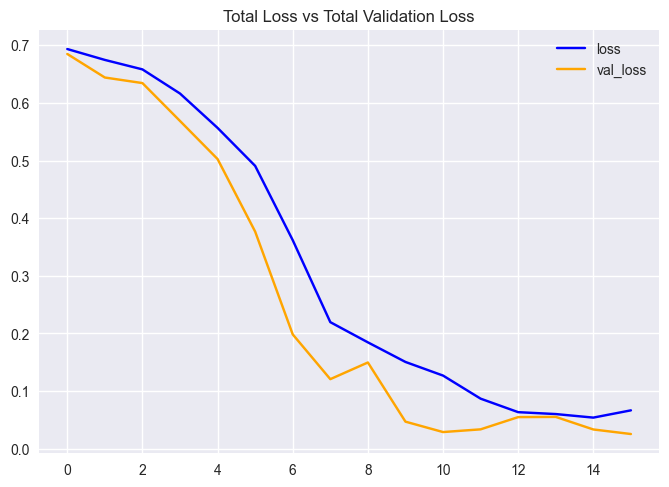

In [18]:
with open('training_history.json', 'r') as json_file:
    loaded_history_dict = json.load(json_file)

loaded_history = {key: np.array(value) for key, value in loaded_history_dict.items()}
 

plot_metric(loaded_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

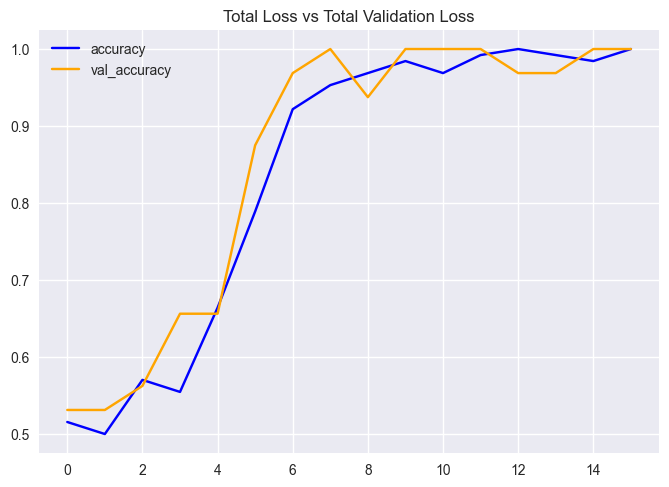

In [19]:
plot_metric(loaded_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

# **Predicting the Test Set**

In [20]:
labels_predict = loaded_model.predict(features_test)

2/2 [==============================] - 30s 5s/step


In [21]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [22]:
labels_test_normal.shape , labels_predict.shape

((40,), (40,))

# **Accuracy Score**

In [23]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.975


Confusion Matrix

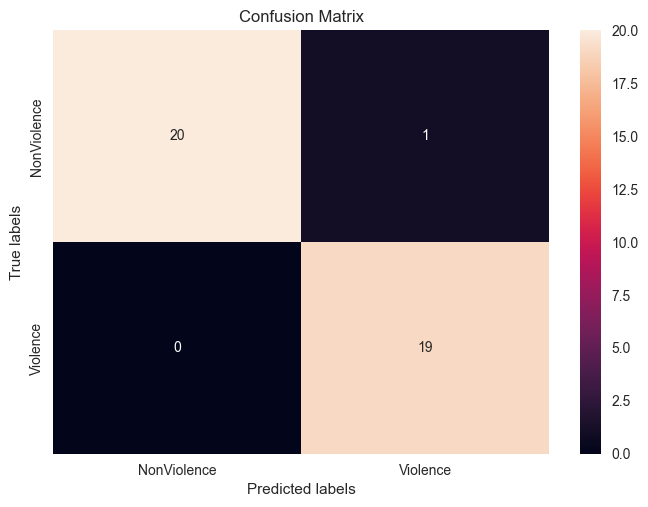

In [24]:
import seaborn as sns 
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['NonViolence', 'Violence']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

# **Classification Report**

In [25]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       1.00      0.95      0.98        21
           1       0.95      1.00      0.97        19

    accuracy                           0.97        40
   macro avg       0.97      0.98      0.97        40
weighted avg       0.98      0.97      0.98        40



# **Prediction Frame By Frame**

In [36]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    
    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        ok, frame = video_reader.read() 
        
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame 
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = loaded_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 6)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 6)
         
        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [27]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()
                            
    video_reader.release()


In [28]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

1/1 [==============================] - 1s 616ms/step


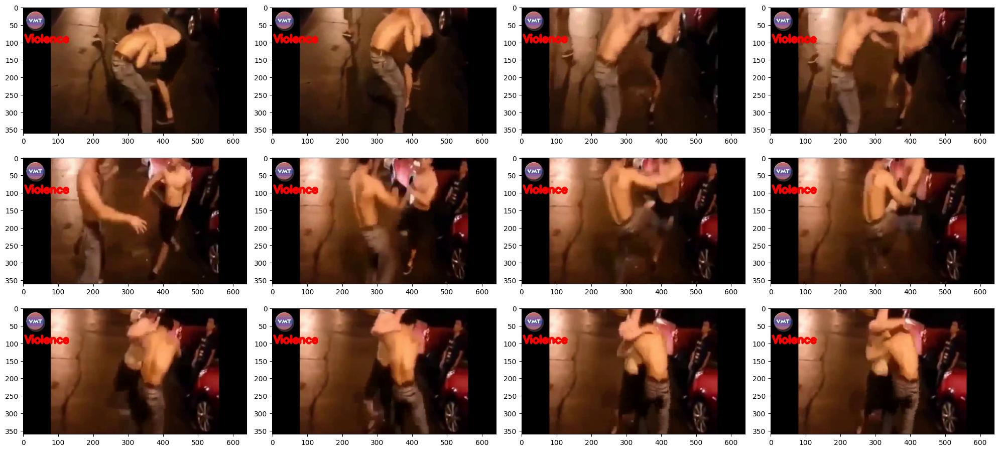

In [29]:
# Specifying video to be predicted
input_video_file_path = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/Violence/V_185.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [30]:
# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 1s 602ms/step


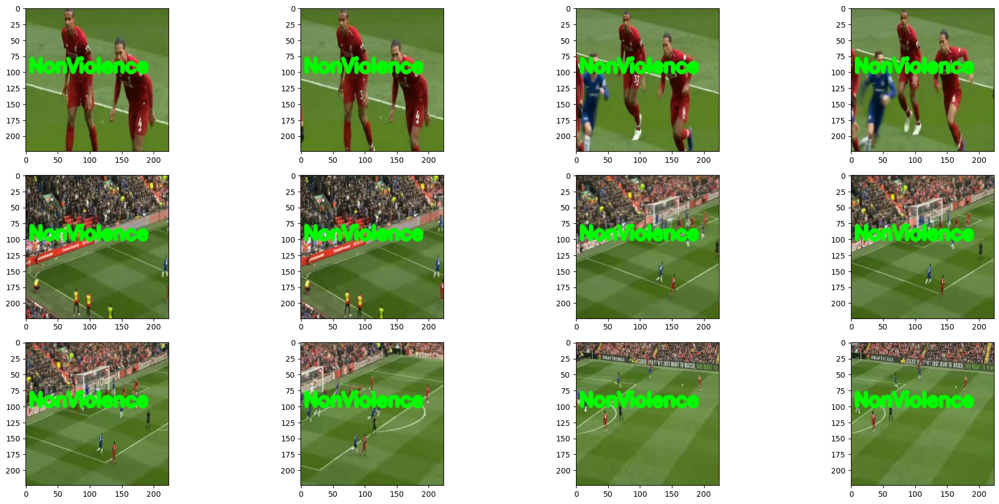

In [31]:
# Specifying video to be predicted
NV_input_video_file_path = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/NonViolence/NV_102.mp4"

# Perform Prediction on the Test Video.
predict_frames(NV_input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [32]:
# Play the actual video
Play_Video(NV_input_video_file_path)

# **Prediction For The Video**

In [37]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = loaded_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [38]:
# Specifying video to be predicted
input_video_file_path = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/Violence/V_776.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 1s 648ms/step
Predicted: Violence
Confidence: 0.9849908947944641


In [39]:
# Specifying video to be predicted
input_video_file_path = "D:/ks-final-project/real-life-violence-situations/Real-Life-Violence-Dataset/NonViolence/NV_263.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 1s 757ms/step
Predicted: NonViolence
Confidence: 0.8024426102638245


In [46]:
import cv2
import numpy as np
from keras.preprocessing import image

# Load the pre-trained model
loaded_model = tf.keras.models.load_model("D:/ks-final-project/Modal/MoBiLSTM_model.h5")

# Function to predict the class of a sequence of frames
def predict_sequence(frames_sequence):
    # Resize each frame to match the model's input size
    resized_frames = [cv2.resize(frame, (224, 224)) for frame in frames_sequence]
    normalized_frames = np.array(resized_frames) / 255.0

    # Perform prediction
    predictions = loaded_model.predict(np.expand_dims(normalized_frames, axis=0))
    predicted_class = CLASSES_LIST[np.argmax(predictions)]

    return predicted_class

# Function to capture video from webcam and perform live prediction
def live_predict():
    # Open a connection to the webcam
    cap = cv2.VideoCapture(0)

    # Initialize a queue to store frames
    frames_queue = []

    while True:
        # Read a frame from the webcam
        ret, frame = cap.read()

        # Append the frame to the queue
        frames_queue.append(frame)

        # Keep only the last 15 frames in the queue
        frames_queue = frames_queue[-15:]

        # Perform prediction on the sequence of frames
        if len(frames_queue) == 15:
            predicted_class = predict_sequence(frames_queue)

            # Draw the predicted class on the video frame with color
            if predicted_class == 'Violence':
                font_color = (0, 0, 255)  # Red color for violence
            else:
                font_color = (0, 255, 0)  # Green color for non-violence

            cv2.putText(frame, f'Predicted: {predicted_class}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, font_color, 2)

        # Display the frame
        cv2.imshow('Webcam', frame)

        # Break the loop if 'q' key is pressed or window is closed
        key = cv2.waitKey(1) & 0xFF
        if key == ord('q') or cv2.getWindowProperty('Webcam', cv2.WND_PROP_VISIBLE) < 1:
            break

    # Release the webcam and close the window
    cap.release()
    cv2.destroyAllWindows()

# Run the live prediction function
live_predict()

1/1 [==============================] - 1s 636ms/step
